In this notebook, we test the significance of the variable `lane`.  Findings:
- LRT tests shows lane only has a statistically significant effect in 12 transcripts
- Correlation of p-values (with or without lane): 85% for carcass data, 90% for testes data.
- Weird arc thing in p-value scatterplot.
- Pairwise comparisons with `lane` as control reveal 257 very different from 238 in carcass data, and to some extent from 188 and 89.  Not all that much signal of pairwise differences in testes data.

## Importing libraries, importing and formatting Kallisto data and condition information

In [1]:
suppressWarnings(library('ggplot2'))
suppressWarnings(library('DESeq2'))
library('RColorBrewer')

Loading required package: S4Vectors
Loading required package: stats4
Loading required package: BiocGenerics
Loading required package: parallel
Note: the specification for S3 class “AsIs” in package ‘BiocGenerics’ seems equivalent to one from package ‘jsonlite’: not turning on duplicate class definitions for this class.

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, as.vector, cbind, colnames,
    do.call, duplicated, eval, evalq, Filter, Find, get, grep, grepl,
    intersect, is.unsorted, lapply, lengths, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,

In [2]:
base_dir <- "~/Desktop/KallistoFiles/results2"
sample_names1<-list.files(base_dir)
sample_names1<-sample_names1[sample_names1!="Zi238_C4_AGTTCC"]  #We remove strain Zi238_C4, as there were too many tpms = 0
sample_names<-gsub('.{7}$', '', sample_names1)
kal_dirs <- sapply(sample_names1, function(id) file.path(base_dir, id))
    
#variable countData: all of the tpm info for all of the Kallisto files, rounded to integers.
countData <- as.character(read.table(file.path(kal_dirs[1], "abundance.tsv"), header = TRUE)$target_id)
for (dir in kal_dirs){
  z<-read.table(file.path(dir, "abundance.tsv"), header=TRUE)
  countData<-data.frame(countData, as.integer(z$est_counts))  #converting to integers
}

#Setting row and column names for countData
colnames(countData)=c("target_id", sample_names)
countData$target_id=read.table(file.path(kal_dirs[1], "abundance.tsv"), header = TRUE)$target_id
rownames(countData)=countData$target_id
countData$target_id=NULL

    
#variable colData: All of the conditions information for the different samples

#The conditions dataset is hiseq_infoAll
colData<-read.table("~/Desktop/KallistoFiles/hiseq_infoAll.txt", header=T, stringsAsFactors=FALSE, sep="\t")
colData<-colData[match(colnames(countData), gsub('.{7}$', '', colData$sample)),]

rownames(colData)=gsub('.{7}$', '', colData$sample)
colData$sample = NULL
colData$lane = factor(colData$lane)
colData$lines = factor(colData$lines)


## Running LRT test

We run a LRT to see which model is better: the full (~lines + tissue + lines:tissue + lane) or the reduced (~lines + tissue + lines:tissue). We find that we prefer the smaller model (lines + tissue + lines:tissue).

In [3]:
dataset <- DESeqDataSetFromMatrix(countData = countData,
                                          colData = colData,
                                          design = ~lines + tissue+ lines:tissue + lane)
dds<-DESeq(dataset)

Warning message:
In DESeqDataSet(se, design = design, ignoreRank): some variables in design formula are characters, converting to factorsestimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [4]:
testingLane<-nbinomLRT(dds, reduced=~lines + tissue + lines:tissue)
results.testingLane<-results(testingLane)
summary(results.testingLane)

found results columns, replacing these



out of 29820 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 11, 0.037% 
LFC < 0 (down)   : 1, 0.0034% 
outliers [1]     : 346, 1.2% 
low counts [2]   : 2887, 9.7% 
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



## Correlation of p-values

We found in a preliminary exploratory data analysis that the biggest differences in gene expression are between carcass and testes. In fact the differences are so big, that we find it more conservative to divide our dataset into carcass data and testes data.
We also create, for each tissue, DESeq datasets conditioning on lines and lane.  lane is a control - we expect it to have no effect. 
We test to see if it really has no effect by looking at the correlation of p-values in models where we included or excluded `lane`.

In [6]:
##dataset C -- just carcass data ; lane effect
colDataCL<-colData[colData$tissue=='C',]
countDataCL<-countData[,colnames(countData) %in% rownames(colDataCL)]
datasetCL <- DESeqDataSetFromMatrix(countData = countDataCL,
                                   colData = colDataCL,
                                   design = ~lines + lane)

##dataset T -- just testes data ; lane effect
colDataTL<-colData[colData$tissue=='T',]
countDataTL<-countData[,colnames(countData) %in% rownames(colDataTL)]
datasetTL <- DESeqDataSetFromMatrix(countData = countDataTL,
                                   colData = colDataTL,
                                   design = ~lines + lane)

##dataset C -- just carcass data ; no lane effect
colDataC<-colData[colData$tissue=='C',]
countDataC<-countData[,colnames(countData) %in% rownames(colDataC)]
datasetC <- DESeqDataSetFromMatrix(countData = countDataC,
                                   colData = colDataC,
                                   design = ~lines)

##dataset T -- just testes data ; no lane effect
colDataT<-colData[colData$tissue=='T',]
countDataT<-countData[,colnames(countData) %in% rownames(colDataT)]
datasetT <- DESeqDataSetFromMatrix(countData = countDataT,
                                   colData = colDataT,
                                   design = ~lines)

In [7]:
ddsC<-DESeq(datasetC)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [8]:
ddsCL<-DESeq(datasetCL)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [9]:
ddsT<-DESeq(datasetT)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [10]:
ddsTL<-DESeq(datasetTL)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.
final dispersion estimates
fitting model and testing


In [13]:
ddsCL.line<-nbinomLRT(ddsCL, reduced=~lane)
results.line.CL<-results(ddsCL.line)
results.line.ordered.CL<-results.line.CL[order(results.line.CL$padj),]
summary(results.line.CL)

found results columns, replacing these



out of 28822 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 266, 0.92% 
LFC < 0 (down)   : 593, 2.1% 
outliers [1]     : 251, 0.87% 
low counts [2]   : 3343, 12% 
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [14]:
ddsC.line<-nbinomLRT(ddsC, reduced=~1)
results.line.C<-results(ddsC.line)
results.line.ordered.C<-results.line.C[order(results.line.C$padj),]
summary(results.line.C)

found results columns, replacing these



out of 28822 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 321, 1.1% 
LFC < 0 (down)   : 440, 1.5% 
outliers [1]     : 409, 1.4% 
low counts [2]   : 4433, 15% 
(mean count < 3)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [15]:
ddsTL.line<-nbinomLRT(ddsTL, reduced=~lane)
results.line.TL<-results(ddsTL.line)
results.line.ordered.TL<-results.line.TL[order(results.line.TL$padj),]
summary(results.line.TL)

found results columns, replacing these



out of 28486 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 152, 0.53% 
LFC < 0 (down)   : 150, 0.53% 
outliers [1]     : 0, 0% 
low counts [2]   : 2202, 7.7% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [17]:
ddsT.line<-nbinomLRT(ddsT, reduced=~1)
results.line.T<-results(ddsT.line)
results.line.ordered.T<-results.line.T[order(results.line.T$padj),]
summary(results.line.T)

found results columns, replacing these



out of 28486 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 102, 0.36% 
LFC < 0 (down)   : 97, 0.34% 
outliers [1]     : 522, 1.8% 
low counts [2]   : 2202, 7.7% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [22]:
cor(results.line.C$pvalue, results.line.CL$pvalue, use="complete.obs")
cor(results.line.T$pvalue, results.line.TL$pvalue, use="complete.obs")

[1] 0.8524513

[1] 0.8979954

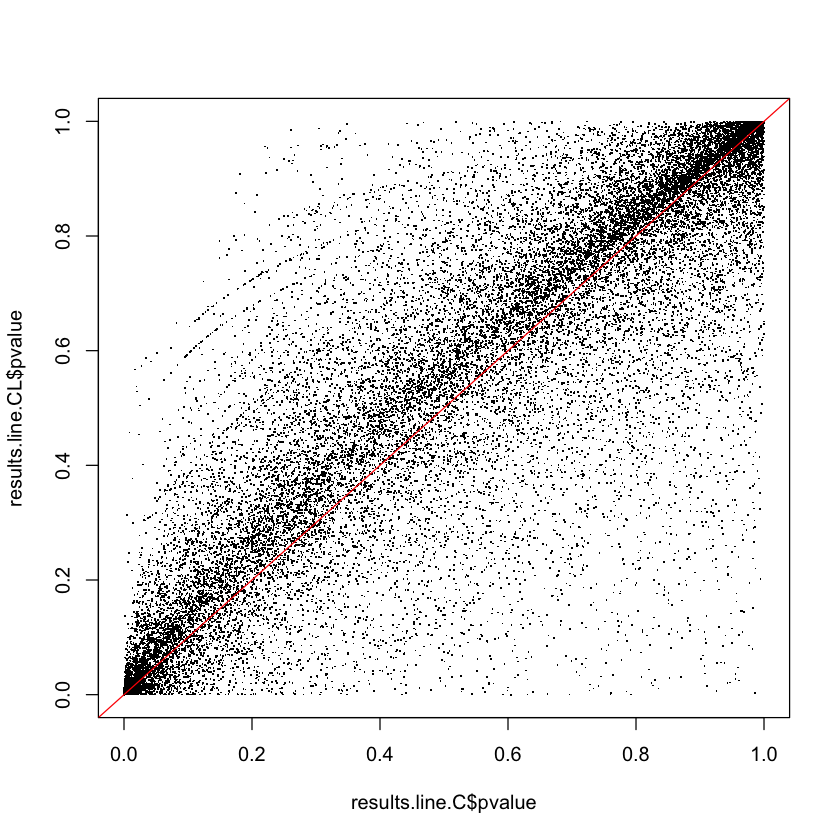

In [26]:
plot(results.line.C$pvalue, results.line.CL$pvalue, pch=".")
abline(a = 0, b=1, col="red")

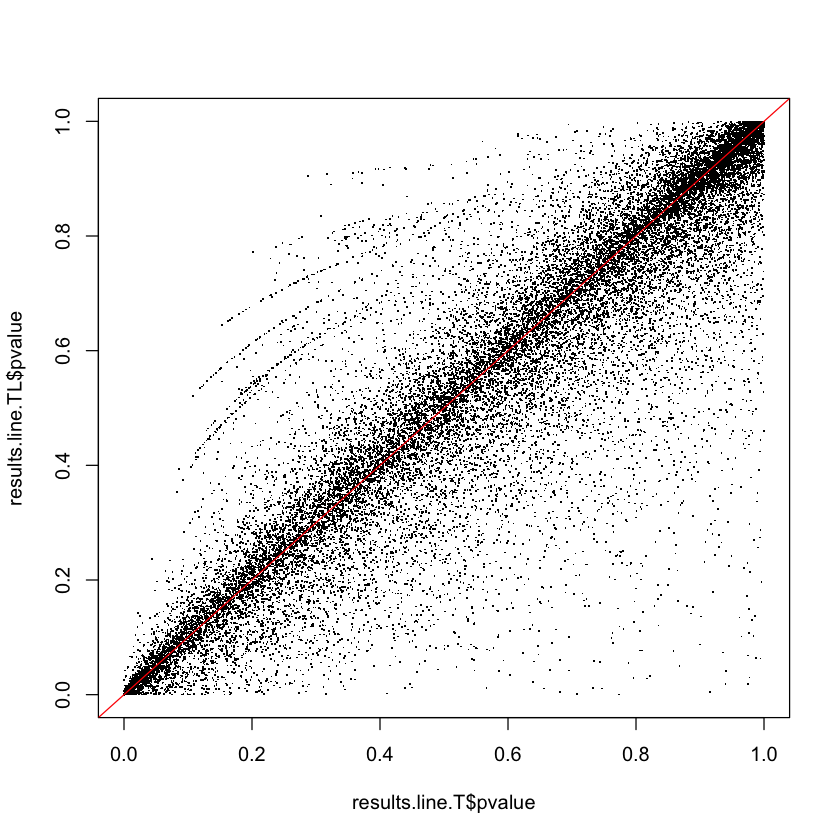

In [27]:
plot(results.line.T$pvalue, results.line.TL$pvalue, pch=".")
abline(a = 0, b=1, col="red")

## Pairwise comparisons with lane as a control

This allows us to see which pairwise comparisons look meaningfully different.  

In carcass data, 257 looks very different than 238 (and also to some extent from 188 and 89).

In testes data, we don't see too much of a pattern.

In [37]:
print("lane 1 vs 2 (control)")
summary(results(ddsCL, contrast=c('lane','1','2')), alpha=0.05)

print("lines 188 vs 238")
summary(results(ddsCL, contrast=c('lines','188','238')), alpha=0.05) #nothing
print("lines 188 vs 89")
summary(results(ddsCL, contrast=c('lines','188','89')), alpha=0.05) #nothing
print("lines 188 vs 257")
summary(results(ddsCL, contrast=c('lines','188','257')), alpha=0.05) #something
print("lines 257 vs 238")
summary(results(ddsCL, contrast=c('lines','257','238')), alpha=0.05) #something bigger
print("lines 257 vs 89")
summary(results(ddsCL, contrast=c('lines','257','89')), alpha=0.05) #something 
print("lines 89 vs 238")
summary(results(ddsCL, contrast=c('lines','89', '238')), alpha=0.05) #something

[1] "lane 1 vs 2 (control)"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 13, 0.045% 
LFC < 0 (down)   : 11, 0.038% 
outliers [1]     : 634, 2.2% 
low counts [2]   : 3225, 11% 
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 238"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 20, 0.069% 
LFC < 0 (down)   : 11, 0.038% 
outliers [1]     : 634, 2.2% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 89"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 6, 0.021% 
LFC < 0 (down)   : 11, 0.038% 
outliers [1]     : 634, 2.2% 
low counts [2]   : 2707, 9.4% 
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 257"

In [38]:
print("lane 1 vs 2 (control)")
summary(results(ddsTL, contrast=c('lane','1','2')), alpha=0.05)

print("lines 188 vs 238")
summary(results(ddsTL, contrast=c('lines','188','238')), alpha=0.05) #nothing
print("lines 188 vs 89")
summary(results(ddsTL, contrast=c('lines','188','89')), alpha=0.05) #nothing
print("lines 188 vs 257")
summary(results(ddsTL, contrast=c('lines','188','257')), alpha=0.05) #something
print("lines 257 vs 238")
summary(results(ddsTL, contrast=c('lines','257','238')), alpha=0.05) #something bigger
print("lines 257 vs 89")
summary(results(ddsTL, contrast=c('lines','257','89')), alpha=0.05) #something 
print("lines 89 vs 238")
summary(results(ddsTL, contrast=c('lines','89', '238')), alpha=0.05) #something

[1] "lane 1 vs 2 (control)"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 23, 0.081% 
LFC < 0 (down)   : 30, 0.11% 
outliers [1]     : 0, 0% 
low counts [2]   : 18160, 64% 
(mean count < 76)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 238"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 14, 0.049% 
LFC < 0 (down)   : 19, 0.067% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 89"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 12, 0.042% 
LFC < 0 (down)   : 21, 0.074% 
outliers [1]     : 0, 0% 
low counts [2]   : 546, 1.9% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 257"

out of 28